# Проект 4 трека CV инженер. Стилизация изображений

Данная работа основана на [туториале из официальной документации pytorch](https://pytorch.org/tutorials/advanced/neural_style_tutorial.html)

## Предварительные работы

Загрузка библиотек и подключение гугл диска

In [1]:
from google.colab import drive
import shutil
import cv2 as cv
from PIL import Image
import os
import copy
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import torchvision.transforms as transforms
from torchvision.models import vgg19, VGG19_Weights

In [2]:
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [3]:
shutil.copytree('/content/drive/MyDrive/Colab Notebooks/Image_stylization', '/content/Images', dirs_exist_ok=True)

'/content/Images'

In [4]:
os.listdir('Images')

['Results', 'Style_images', 'Example_images']

Проверка изображений стиля и изобржений для проверки работы модели

In [5]:
styles_dir = 'Images/Style_images'
examples_dir = 'Images/Example_images'

In [6]:
def show_images_in_dir(dir, title=None, n_cols=0):
  imgs = os.listdir(dir)
  n_imgs = len(imgs)
  if n_cols > n_imgs or n_cols == 0:
    fig, ax = plt.subplots(1, n_imgs, figsize = (20, 5))
    if title!=None:
      fig.suptitle(title)
    for i in range(n_imgs):
      img = Image.open(os.path.join(dir, imgs[i]))
      ax[i].imshow(img)
      ax[i].set_title(imgs[i])
  else:
    n_rows = -(-n_imgs//n_cols)
    fig, ax = plt.subplots(n_rows, n_cols, figsize = (20, 20/(n_imgs//n_cols)+2))#n_rows * (40/(n_imgs//n_cols)+2)))
    if title!=None:
      fig.suptitle(title)
    for i in range(n_imgs):
      img = Image.open(os.path.join(dir, imgs[i]))
      col = i % n_cols
      row = i//n_cols
      ax[row, col].imshow(img)
      ax[row, col].set_title(imgs[i])


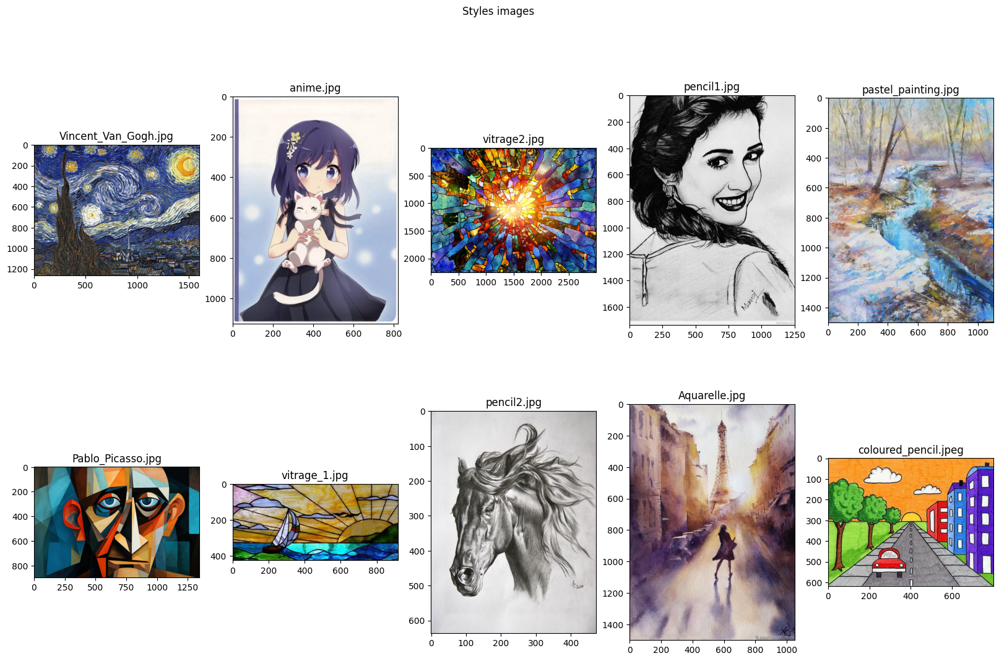

In [7]:
show_images_in_dir(styles_dir, "Styles images", 5)
plt.show()

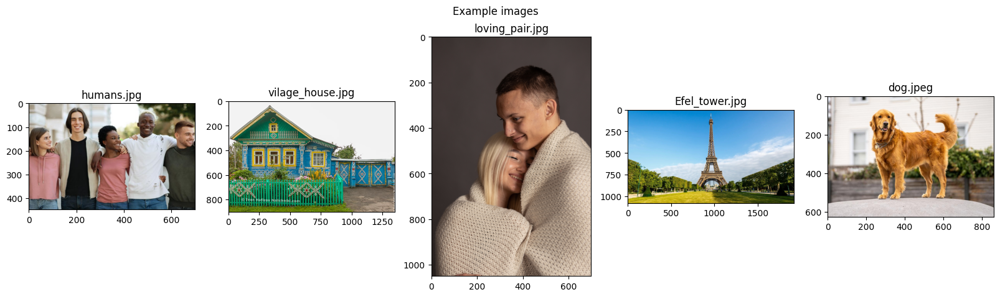

In [ ]:
show_images_in_dir(examples_dir, "Example images")

Итак, было выбрано 10 изображений стиля из интернета и 5 изображений примеров

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.set_default_device(device)

## Подготовка данных

Создание лоадеров стилей и изображений

In [ ]:
imsize = 512 if torch.cuda.is_available() else 128  # use small size if no GPU

loader = transforms.Compose([
    transforms.Resize(imsize),  # scale imported image
    transforms.ToTensor()])  # transform it into a torch tensor


def image_loader(image_name):
    image = Image.open(image_name)
    image = image.resize((imsize, imsize))
    # fake batch dimension required to fit network's input dimensions
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)


style_img = image_loader(styles_dir + "/vitrage_1.jpg")
example_img = image_loader(examples_dir + "/dog.jpeg")

#assert style_img.size() == example_img.size(), "we need to import style and example images of the same size"

Проверка работы лоадеров. Для отрисовки преобразуем изображения обратно из тензоров.

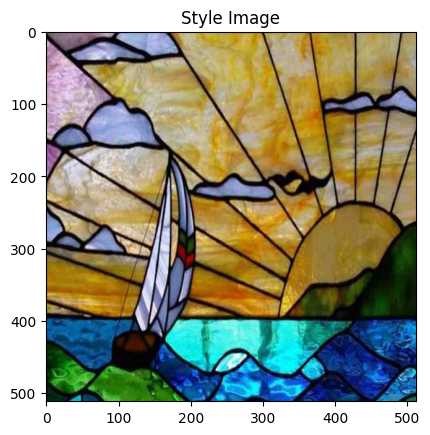

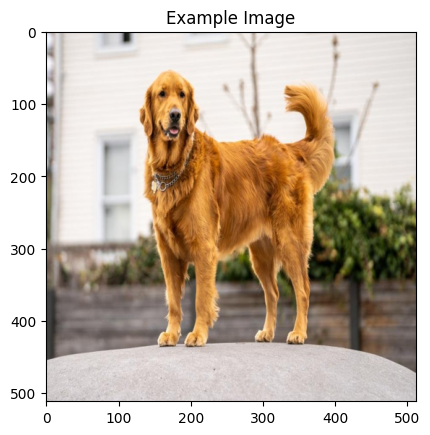

In [ ]:
unloader = transforms.ToPILImage()  # reconvert into PIL image

plt.ion()

def imshow(tensor, title=None):
    image = tensor.cpu().clone()  # we clone the tensor to not do changes on it
    image = image.squeeze(0)      # remove the fake batch dimension
    image = unloader(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001) # pause a bit so that plots are updated


plt.figure()
imshow(style_img, title='Style Image')

plt.figure()
imshow(example_img, title='Example Image')

Итак, лоадеры работают

### Создание модели

Для обучения стиля создадим модель на базе VGG19

При этом основаня идея состоит в том, что мы будем обучать не саму модель, а прри каждом цикле трэйна оптимизировать изображения, высчитывая его потери по отношению к исходному изображению и изображению стиля, причем их внутренние фаторы будт извлекатся из слоев сверток VGG19 - для стиля из сверток с 1 по 5, а для контента из 4 свертки. Затем, результаты применения этих сверток соответственно на контенте и стиле подадим в созданные соответствющие слои функции потерь, основанные на использования матрицы грама. Также добавим слои потерь в модель. В конце мы зафиксируем веса всех слоев модели а в качестве оптимизируемых параметров в оптимизатор подадим трансформируемое изображение.

In [ ]:
class ContentLoss(nn.Module):

    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        # we 'detach' the target content from the tree used
        # to dynamically compute the gradient: this is a stated value,
        # not a variable. Otherwise the forward method of the criterion
        # will throw an error.
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

In [ ]:
def gram_matrix(input):
    a, b, c, d = input.size()  # a=batch size(=1)
    # b=number of feature maps
    # (c,d)=dimensions of a f. map (N=c*d)

    features = input.view(a * b, c * d)  # resize F_XL into \hat F_XL

    G = torch.mm(features, features.t())  # compute the gram product

    # we 'normalize' the values of the gram matrix
    # by dividing by the number of element in each feature maps.
    return G.div(a * b * c * d)

In [ ]:
class StyleLoss(nn.Module):

    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

In [ ]:
cnn = vgg19(weights=VGG19_Weights.DEFAULT).features.eval()

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:07<00:00, 80.6MB/s]


In [ ]:
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406])
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225])

# create a module to normalize input image so we can easily put it in a
# ``nn.Sequential``
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        # .view the mean and std to make them [C x 1 x 1] so that they can
        # directly work with image Tensor of shape [B x C x H x W].
        # B is batch size. C is number of channels. H is height and W is width.
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        # normalize ``img``
        return (img - self.mean) / self.std

In [ ]:
# desired depth layers to compute style/content losses :
content_layers_default = ['conv_4']
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               style_img, content_img,
                               content_layers=content_layers_default,
                               style_layers=style_layers_default):
    # normalization module
    normalization = Normalization(normalization_mean, normalization_std)

    # just in order to have an iterable access to or list of content/style
    # losses
    content_losses = []
    style_losses = []

    # assuming that ``cnn`` is a ``nn.Sequential``, so we make a new ``nn.Sequential``
    # to put in modules that are supposed to be activated sequentially
    model = nn.Sequential(normalization)

    i = 0  # increment every time we see a conv
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            # The in-place version doesn't play very nicely with the ``ContentLoss``
            # and ``StyleLoss`` we insert below. So we replace with out-of-place
            # ones here.
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            # add content loss:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            # add style loss:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    # now we trim off the layers after the last content and style losses
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]

    return model, style_losses, content_losses

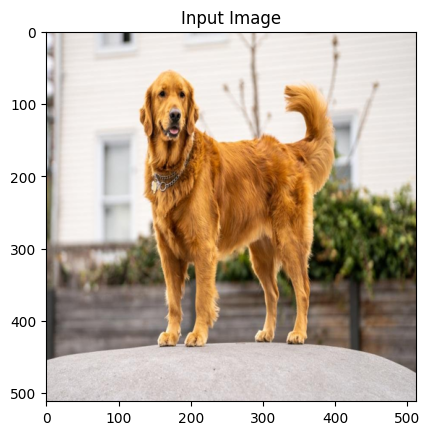

In [ ]:
input_img = example_img.clone()
# if you want to use white noise by using the following code:
#
# .. code-block:: python
#
#    input_img = torch.randn(example_img.data.size())

# add the original input image to the figure:
plt.figure()
imshow(input_img, title='Input Image')

In [ ]:
def get_input_optimizer(input_img):
    # this line to show that input is a parameter that requires a gradient
    optimizer = optim.LBFGS([input_img])
    return optimizer

## Обучение

Хотя вернее в данном случае называть это не обучением а трансформацией изображения. Т.к. на каждом шаге будет происходить не изменение весов модели, а изменение значений пикселей изображения.

In [ ]:
def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_img, style_img, input_img, num_steps=200,
                       style_weight=1000000, content_weight=1):
    """Run the style transfer."""
    print('Building the style transfer model..')
    score = [0]
    score[0] = 1e+20
    model, style_losses, content_losses = get_style_model_and_losses(cnn,
        normalization_mean, normalization_std, style_img, content_img)

    # We want to optimize the input and not the model parameters so we
    # update all the requires_grad fields accordingly
    input_img.requires_grad_(True)
    # We also put the model in evaluation mode, so that specific layers
    # such as dropout or batch normalization layers behave correctly.
    model.eval()
    model.requires_grad_(False)

    optimizer = get_input_optimizer(input_img)

    print('Optimizing..')
    run = [0]
    while run[0] <= num_steps:

        def closure():
            # correct the values of updated input image
            with torch.no_grad():
                input_img.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            style_score = 0
            content_score = 0

            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()

            run[0] += 1
            if run[0] % 50 == 0:
                print("run {}:".format(run))
                print('Style Loss : {:4f} Content Loss: {:4f}'.format(
                    style_score.item(), content_score.item()))
                print()
            score_this = style_score.item() + content_score.item()
            if score_this<score[0] and run[0]>100:
                torch.save(model, "model.trch")
                score[0] = score_this
            return style_score + content_score

        optimizer.step(closure)

    # a last correction...
    with torch.no_grad():
        input_img.clamp_(0, 1)

    return input_img

Проведем тестовый запуск

Building the style transfer model..


/usr/local/lib/python3.10/dist-packages/torch/utils/_device.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Optimizing..
run [50]:
Style Loss : 330.992920 Content Loss: 17.875366

run [100]:
Style Loss : 92.155037 Content Loss: 18.956581

run [150]:
Style Loss : 43.093685 Content Loss: 19.549110

run [200]:
Style Loss : 14.317537 Content Loss: 18.927673



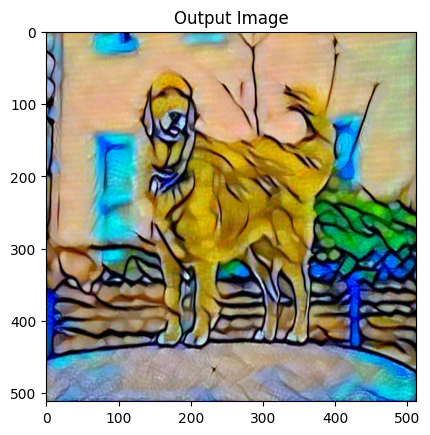

In [ ]:
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            example_img, style_img, input_img)

plt.figure()
imshow(output, title='Output Image')

# sphinx_gallery_thumbnail_number = 4
plt.ioff()
plt.show()

Итак перенос стиля выполнен вполне успешно - не без огрехов, но вполне достойно. С учетом того, что не потребовалось многочасовое обучение модели машине с большим колличеством мошных GPU.
Минусом этого подходя является, что инференс модели работает не очень быстро и для потокового видео не очень подходит. Но для стилизации одиночных изображений впллне может использоватся.

## Перенос модели для использования в приложениях

Для использования в приложениях удобнее будет собрать большую часть кода в отдельный класс, который с добавлением нескольких функций поместить в отдельный модуль.

In [ ]:
class Style_transferer:

    def __init__(self):
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.imsize = 512 if torch.cuda.is_available() else 128
        self.loader = transforms.Compose([
            transforms.Resize(imsize),  # scale imported image
            transforms.ToTensor()])
        self.content_layers_default = ['conv_4']
        self.style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']
        self.cnn = vgg19(weights=VGG19_Weights.DEFAULT).features.eval()
        self.cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406])
        self.cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225])


    def image_loader(self, image):
        # fake batch dimension required to fit network's input dimensions
        image = self.loader(image).unsqueeze(0)
        return image.to(self.device, torch.float)

    def init_input_optimizer(self, input_img):
        # this line to show that input is a parameter that requires a gradient
        self.optimizer = optim.LBFGS([input_img])

    def init_style_model_and_losses(self, cnn, normalization_mean, normalization_std,
                                style_img, content_img,
                                content_layers=['conv_4'],
                                style_layers=['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']):
        # normalization module
        normalization = Normalization(normalization_mean, normalization_std)

        # just in order to have an iterable access to or list of content/style
        # losses
        self.content_losses = []
        self.style_losses = []

        # assuming that ``cnn`` is a ``nn.Sequential``, so we make a new ``nn.Sequential``
        # to put in modules that are supposed to be activated sequentially
        self.model = nn.Sequential(normalization)

        i = 0  # increment every time we see a conv
        for layer in cnn.children():
            if isinstance(layer, nn.Conv2d):
                i += 1
                name = 'conv_{}'.format(i)
            elif isinstance(layer, nn.ReLU):
                name = 'relu_{}'.format(i)
                # The in-place version doesn't play very nicely with the ``ContentLoss``
                # and ``StyleLoss`` we insert below. So we replace with out-of-place
                # ones here.
                layer = nn.ReLU(inplace=False)
            elif isinstance(layer, nn.MaxPool2d):
                name = 'pool_{}'.format(i)
            elif isinstance(layer, nn.BatchNorm2d):
                name = 'bn_{}'.format(i)
            else:
                raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

            self.model.add_module(name, layer)

            if name in content_layers:
                # add content loss:
                target = self.model(content_img).detach()
                content_loss = ContentLoss(target)
                self.model.add_module("content_loss_{}".format(i), content_loss)
                self.content_losses.append(content_loss)

            if name in style_layers:
                # add style loss:
                target_feature = self.model(style_img).detach()
                style_loss = StyleLoss(target_feature)
                self.model.add_module("style_loss_{}".format(i), style_loss)
                self.style_losses.append(style_loss)

        # now we trim off the layers after the last content and style losses
        for i in range(len(self.model) - 1, -1, -1):
            if isinstance(self.model[i], ContentLoss) or isinstance(self.model[i], StyleLoss):
                break

        self.model = self.model[:(i + 1)]

    def run_style_transfer(self, content_img, style_img, input_img, num_steps=100,
                        style_weight=1000000, content_weight=1, verbose = False):
        """Run the style transfer."""
        if verbose:
            print('Building the style transfer model..')
        score = [0]
        score[0] = 1e+20
        self.init_style_model_and_losses(self.cnn,
            self.cnn_normalization_mean, self.cnn_normalization_std, style_img, content_img)

        # We want to optimize the input and not the model parameters so we
        # update all the requires_grad fields accordingly
        input_img.requires_grad_(True)
        # We also put the model in evaluation mode, so that specific layers
        # such as dropout or batch normalization layers behave correctly.
        self.model.eval()
        self.model.requires_grad_(False)

        self.init_input_optimizer(input_img)

        if verbose:
            print('Optimizing..')
        run = [0]
        while run[0] <= num_steps:

            def closure():
                # correct the values of updated input image
                with torch.no_grad():
                    input_img.clamp_(0, 1)

                self.optimizer.zero_grad()
                self.model(input_img)
                style_score = 0
                content_score = 0

                for sl in self.style_losses:
                    style_score += sl.loss
                for cl in self.content_losses:
                    content_score += cl.loss

                style_score *= style_weight
                content_score *= content_weight

                self.loss = style_score + content_score
                self.loss.backward(),

                run[0] += 1
                if verbose:
                    if run[0] % 50 == 0:
                        print("run {}:".format(run))
                        print('Style Loss : {:4f} Content Loss: {:4f}'.format(
                            style_score.item(), content_score.item()))
                        print()
                score_this = style_score.item() + content_score.item()
                #if score_this<score[0] and run[0]>100:
                #    torch.save(self.model, "model.trch")
                #    score[0] = score_this
                return style_score + content_score

            self.optimizer.step(closure)

        # a last correction...
        with torch.no_grad():
            input_img.clamp_(0, 1)

        return input_img

    def stylize(self, image, style_img, num_steps=100, style_weight=1000000, content_weight=1, verbose = False):
        image = Image.open(image)
        width, height = image.size
        ratio = width / height
        resize_height = self.imsize / ratio
        image = image.resize((self.imsize, self.imsize))
        style_img = Image.open(style_img)
        style_img = style_img.resize((self.imsize, self.imsize))
        style_img = self.image_loader(style_img)
        image = self.image_loader(image)
        input_img = image.clone()
        out = self.run_style_transfer(image, style_img, input_img, num_steps, style_weight, content_weight, verbose)
        out = out.squeeze(0)
        out = out.permute(1, 2, 0).cpu().detach().numpy()
        out = np.uint8(out*255)
        out = Image.fromarray(out)
        out = out.resize((self.imsize, int(resize_height)))
        return out

In [ ]:
import time
import tqdm

Протестируем работу созданного класса

torch.Size([1, 3, 512, 512])
(512, 512, 3) 255
<PIL.Image.Image image mode=RGB size=512x512 at 0x7D4D5ABCF5B0>


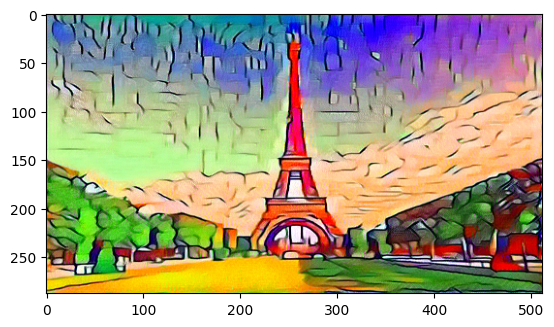

In [ ]:
plt.imshow(Style_transferer().stylize('/content/Images/Example_images/Efel_tower.jpg', '/content/Images/Style_images/coloured_pencil.jpeg'))
plt.show()

In [ ]:
def imshow_in_ax(tensor, figure, title=None):
    figure.imshow(image)
    if title is not None:
        figure.set_title(title)

In [ ]:
st = Style_transferer()
styles = os.listdir(styles_dir)
start = time.time()
outputs = []
for image in os.listdir(examples_dir):
    item = []
    for style in tqdm.tqdm(styles, desc = "Styles"):
        item.append({
            'title': style.split(".")[0],
            'out': st.stylize(image=os.path.join(examples_dir, image), style_img=os.path.join(styles_dir, style))
        })
    outputs.append(item)
print(f'Inference time - {round((time.time() - start), 2)} sec')

Styles: 100%|██████████| 10/10 [01:07<00:00,  6.74s/it]

Inference time - 336.58 sec


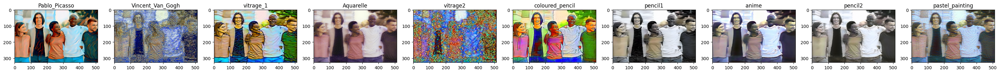

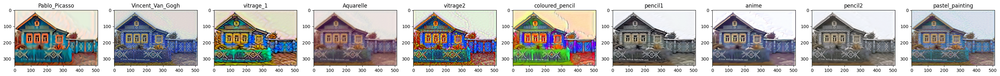

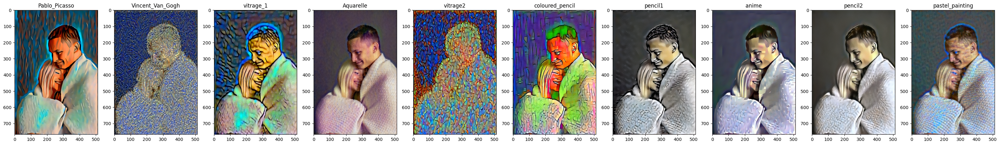

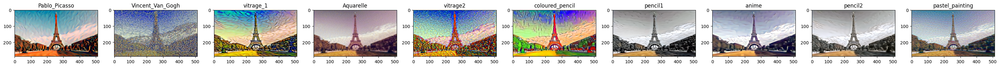

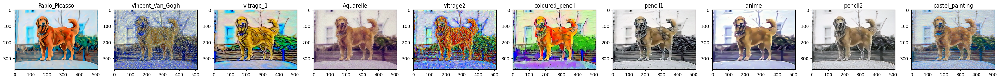

In [ ]:
for o_i, im in enumerate(outputs):
    fig, ax = plt.subplots(1, len(im), figsize = (40, 12))
    for i, style in enumerate(im):
        ax[i].imshow(style['out'])
        ax[i].set_title(style['title'])
    fig.savefig(f'/content/drive/MyDrive/Colab Notebooks/Image_stylization/Results/Example_{o_i}')
plt.show()

Итак собранная в класс модель работает хорошо, преобразование одного изображения проиходит приемрно за 6,7 секунды.
Тпереь создадим приемр инференса модели для веб приложения